# import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import platform

import geopandas as gpd
from shapely.geometry import Point, Polygon

In [74]:
path = r"C:\Users\deepi\Downloads\2015StreetTreesCensus_TREES.csv"
df2 = pd.read_csv(path)
df2.head()

,created_at,tree_id,block_id,the_geom,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,...,st_assem,st_senate,nta,nta_name,boro_ct,state,Latitude,longitude,x_sp,y_sp
0,08/27/2015,180683,348711,POINT (-73.84421521958048 40.723091773924274),3,0,OnCurb,Alive,Fair,Acer rubrum,...,28,16,QN17,Forest Hills,4073900,New York,40.723092,-73.844215,1.027431e+06,202756.768749
1,09/03/2015,200540,315986,POINT (-73.81867945834878 40.79411066708779),21,0,OnCurb,Alive,Fair,Quercus palustris,...,27,11,QN49,Whitestone,4097300,New York,40.794111,-73.818679,1.034456e+06,228644.837379
2,09/05/2015,204026,218365,POINT (-73.93660770459083 40.717580740099116),3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,50,18,BK90,East Williamsburg,3044900,New York,40.717581,-73.936608,1.001823e+06,200716.891267
3,09/05/2015,204337,217969,POINT (-73.93445615919741 40.713537494833226),10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,53,18,BK90,East Williamsburg,3044900,New York,40.713537,-73.934456,1.002420e+06,199244.253136
4,08/30/2015,189565,223043,POINT (-73.97597938483258 40.66677775537875),21,0,OnCurb,Alive,Good,Tilia americana,...,44,21,BK37,Park Slope-Gowanus,3016500,New York,40.666778,-73.975979,9.909138e+05,182202.425999


In [75]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 683788 entries, 0 to 683787
Data columns (total 42 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   created_at  683788 non-null  object 
 1   tree_id     683788 non-null  int64  
 2   block_id    683788 non-null  int64  
 3   the_geom    683788 non-null  object 
 4   tree_dbh    683788 non-null  int64  
 5   stump_diam  683788 non-null  int64  
 6   curb_loc    683788 non-null  object 
 7   status      683788 non-null  object 
 8   health      652172 non-null  object 
 9   spc_latin   652169 non-null  object 
 10  spc_common  652169 non-null  object 
 11  steward     652173 non-null  object 
 12  guards      652172 non-null  object 
 13  sidewalk    652172 non-null  object 
 14  user_type   683788 non-null  object 
 15  problems    652124 non-null  object 
 16  root_stone  683788 non-null  object 
 17  root_grate  683788 non-null  object 
 18  root_other  683788 non-null  object 
 19  tr

In [76]:
df2.isnull().sum()

created_at        0
tree_id           0
block_id          0
the_geom          0
tree_dbh          0
stump_diam        0
curb_loc          0
status            0
health        31616
spc_latin     31619
spc_common    31619
steward       31615
guards        31616
sidewalk      31616
user_type         0
problems      31664
root_stone        0
root_grate        0
root_other        0
trnk_wire         0
trnk_light        0
trnk_other        0
brnch_ligh        0
brnch_shoe        0
brnch_othe        0
address           0
zipcode           0
zip_city          0
cb_num            0
borocode          0
boroname          0
cncldist          0
st_assem          0
st_senate         0
nta               0
nta_name          0
boro_ct           0
state             0
Latitude          0
longitude         0
x_sp              0
y_sp              0
dtype: int64

In [77]:
df2['zip_city'].fillna('Unknown', inplace=True)
df2['boro_ct'].fillna(0, inplace=True)

In [78]:
# Convert common species names to title case
df2['spc_common'] = [name.title() if not pd.isna(name) else name for name in df2['spc_common']]

In [79]:
# Fill 'health' with 'dead' where 'status' is not 'alive'
df2['health'] = ['Dead' if status != 'Alive' else health for status, health in zip(df2['status'], df2['health'])]

In [80]:
# Drop rows where 'health' is empty
df2.dropna(subset=['health'], axis=0, inplace=True)

In [81]:
# Selecting a subset of columns
selected_columns = ['tree_dbh', 'status', 'health', 'spc_common', 'boroname', 'Latitude', 'longitude']
df_subset = df2[selected_columns]

# Displaying information about the subset DataFrame
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 683787 entries, 0 to 683787
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   tree_dbh    683787 non-null  int64  
 1   status      683787 non-null  object 
 2   health      683787 non-null  object 
 3   spc_common  652168 non-null  object 
 4   boroname    683787 non-null  object 
 5   Latitude    683787 non-null  float64
 6   longitude   683787 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 41.7+ MB


In [82]:
# Normalize tree counts by tree species
species_counts = df2["spc_common"].value_counts(normalize=True, dropna=True).reset_index()
species_counts.columns = ["species", "proportion"]

# Select the top 10 species
top_species1 = species_counts.head(10)

# Display the top species
display(top_species1)

,species,proportion
0,London Planetree,0.133423
1,Honeylocust,0.098539
2,Callery Pear,0.090362
3,Pin Oak,0.081551
4,Norway Maple,0.052424
5,Littleleaf Linden,0.045605
6,Cherry,0.044895
7,Japanese Zelkova,0.044863
8,Ginkgo,0.032237
9,Sophora,0.029652


In [83]:
import pandas as pd

# Replace 'your_file.csv' with the actual path to your CSV file
path = r'C:\Users\deepi\Downloads\2005_Street_Tree_Census_20231113.csv'

# Read CSV into a Pandas DataFrame
df1 = pd.read_csv(path, low_memory=False)
df1.head(5)

,OBJECTID,cen_year,tree_dbh,address,tree_loc,pit_type,soil_lvl,status,spc_latin,spc_common,...,state,latitude,longitude,x_sp,y_sp,objectid_1,census tract,bin,bbl,Location 1
0,592373,2005,6,1139 57 STREET,Front,Sidewalk Pit,Level,Good,PYRUS CALLERYANA,"PEAR, CALLERY",...,New York,40.632653,-74.000245,984182,169769,0,216.0,3140038.0,3.056890e+09,"(40.63265321, -74.00024499)"
1,592374,2005,6,2220 BERGEN AVENUE,Across,Sidewalk Pit,Level,Good,PLATANUS ACERIFOLIA,LONDON PLANETREE,...,New York,40.620084,-73.901453,1011608,165205,1,706.0,3238037.0,3.084440e+09,"(40.62008375, -73.9014528)"
2,592375,2005,13,2360 BERGEN AVENUE,Front,Continuous Pit,Level,Good,ACER PLATANOIDES CRIMSON KING,"MAPLE, NORWAY-CR KNG",...,New York,40.617996,-73.899111,1012259,164445,2,706.0,3238299.0,3.084530e+09,"(40.61799567, -73.89911096)"
3,592376,2005,13,2254 BERGEN AVENUE,Across,Sidewalk Pit,Level,Good,PLATANUS ACERIFOLIA,LONDON PLANETREE,...,New York,40.619694,-73.901003,1011733,165063,3,706.0,3238045.0,3.084440e+09,"(40.6196936, -73.90100311)"
4,592377,2005,15,2332 BERGEN AVENUE,Across,Sidewalk Pit,Level,Good,PLATANUS ACERIFOLIA,LONDON PLANETREE,...,New York,40.618323,-73.899467,1012160,164564,4,706.0,3238294.0,3.084530e+09,"(40.61832261, -73.89946707)"


In [84]:
# Display data types of each column
print(df1.dtypes)

# Convert specific columns to appropriate data types
# For example, if 'latitude' and 'longitude' need to be converted to float:
df1['latitude'] = pd.to_numeric(df1['latitude'], errors='coerce')
df1['longitude'] = pd.to_numeric(df1['longitude'], errors='coerce')

# Handle missing values if needed
# For example, fill missing values in 'latitude' and 'longitude' with 0
df1['latitude'].fillna(0, inplace=True)
df1['longitude'].fillna(0, inplace=True)

# Display modified data types
print(df1.dtypes)

OBJECTID          int64
cen_year          int64
tree_dbh          int64
address          object
tree_loc         object
pit_type         object
soil_lvl         object
status           object
spc_latin        object
spc_common       object
vert_other       object
vert_pgrd        object
vert_tgrd        object
vert_wall        object
horz_blck        object
horz_grate       object
horz_plant       object
horz_other       object
sidw_crack       object
sidw_raise       object
wire_htap        object
wire_prime       object
wire_2nd         object
wire_other       object
inf_canopy       object
inf_guard        object
inf_wires        object
inf_paving       object
inf_outlet       object
inf_shoes        object
inf_lights       object
inf_other        object
trunk_dmg        object
zipcode           int64
zip_city         object
cb_num            int64
borocode          int64
boroname         object
cncldist          int64
st_assem          int64
st_senate         int64
nta             

In [85]:
df1.replace("?",np.NaN,inplace=True)

In [86]:
df1.isnull().sum()

OBJECTID             0
cen_year             0
tree_dbh             0
address              0
tree_loc             0
pit_type             0
soil_lvl             0
status               0
spc_latin            0
spc_common           0
vert_other           0
vert_pgrd            0
vert_tgrd            0
vert_wall            0
horz_blck            0
horz_grate           0
horz_plant           0
horz_other           0
sidw_crack           0
sidw_raise           0
wire_htap            0
wire_prime           0
wire_2nd             0
wire_other           0
inf_canopy           0
inf_guard            0
inf_wires            0
inf_paving           0
inf_outlet           0
inf_shoes            0
inf_lights           0
inf_other            0
trunk_dmg            0
zipcode              0
zip_city          8911
cb_num               0
borocode             0
boroname             0
cncldist             0
st_assem             0
st_senate            0
nta                  0
nta_name             0
boro_ct    

In [87]:
df1['zip_city'].fillna('Unknown', inplace=True)
df1['boro_ct'].fillna(0, inplace=True)

In [88]:
# Get the column names
columns = df1.columns

# Display the column names
print(columns)

Index(['OBJECTID', 'cen_year', 'tree_dbh', 'address', 'tree_loc', 'pit_type',
       'soil_lvl', 'status', 'spc_latin', 'spc_common', 'vert_other',
       'vert_pgrd', 'vert_tgrd', 'vert_wall', 'horz_blck', 'horz_grate',
       'horz_plant', 'horz_other', 'sidw_crack', 'sidw_raise', 'wire_htap',
       'wire_prime', 'wire_2nd', 'wire_other', 'inf_canopy', 'inf_guard',
       'inf_wires', 'inf_paving', 'inf_outlet', 'inf_shoes', 'inf_lights',
       'inf_other', 'trunk_dmg', 'zipcode', 'zip_city', 'cb_num', 'borocode',
       'boroname', 'cncldist', 'st_assem', 'st_senate', 'nta', 'nta_name',
       'boro_ct', 'state', 'latitude', 'longitude', 'x_sp', 'y_sp',
       'objectid_1', 'census tract', 'bin', 'bbl', 'Location 1'],
      dtype='object')


In [89]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 592372 entries, 0 to 592371
Data columns (total 54 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   OBJECTID      592372 non-null  int64  
 1   cen_year      592372 non-null  int64  
 2   tree_dbh      592372 non-null  int64  
 3   address       592372 non-null  object 
 4   tree_loc      592372 non-null  object 
 5   pit_type      592372 non-null  object 
 6   soil_lvl      592372 non-null  object 
 7   status        592372 non-null  object 
 8   spc_latin     592372 non-null  object 
 9   spc_common    592372 non-null  object 
 10  vert_other    592372 non-null  object 
 11  vert_pgrd     592372 non-null  object 
 12  vert_tgrd     592372 non-null  object 
 13  vert_wall     592372 non-null  object 
 14  horz_blck     592372 non-null  object 
 15  horz_grate    592372 non-null  object 
 16  horz_plant    592372 non-null  object 
 17  horz_other    592372 non-null  object 
 18  sidw

In [90]:
# Normalize tree counts by tree species
species_counts = df1["spc_common"].value_counts(normalize=True, dropna=True).reset_index()
species_counts.columns = ["species", "proportion"]

# Select the top 10 species
top_species = species_counts.head(10)

# Display the top species
display(top_species)

,species,proportion
0,LONDON PLANETREE,0.151136
1,"MAPLE, NORWAY",0.126139
2,"PEAR, CALLERY",0.107353
3,HONEYLOCUST,0.088105
4,"OAK, PIN",0.074100
5,"LINDEN, LITTLE LEAF",0.046700
6,"ASH, GREEN",0.034816
7,"MAPLE, RED",0.034191
8,"MAPLE, SILVER",0.031511
9,UNKNOWN,0.030997


In [91]:
# Specify the file path to the CSV file
file_path = r"C:\Users\deepi\Downloads\nybb.csv"

# Read the CSV file into a DataFrame
borough_boundaries = pd.read_csv(file_path)

# Display the first 5 rows of the DataFrame
print(borough_boundaries.head(5))


                                            the_geom  BoroCode       BoroName  \
0  MULTIPOLYGON (((-74.05050806403247 40.56642203...         5  Staten Island   
1  MULTIPOLYGON (((-73.89680883223778 40.79580844...         2          Bronx   
2  MULTIPOLYGON (((-73.82644661516991 40.59052744...         4         Queens   
3  MULTIPOLYGON (((-74.01092841268026 40.68449147...         1      Manhattan   
4  MULTIPOLYGON (((-73.86327471071958 40.58387684...         3       Brooklyn   

      Shape_Leng    Shape_Area  
0  325917.353950  1.623621e+09  
1  463179.772813  1.187175e+09  
2  888199.730955  3.041419e+09  
3  357713.308660  6.365205e+08  
4  728148.532410  1.934138e+09  


In [92]:
print(borough_boundaries.info) 

<bound method DataFrame.info of                                             the_geom  BoroCode       BoroName  \
0  MULTIPOLYGON (((-74.05050806403247 40.56642203...         5  Staten Island   
1  MULTIPOLYGON (((-73.89680883223778 40.79580844...         2          Bronx   
2  MULTIPOLYGON (((-73.82644661516991 40.59052744...         4         Queens   
3  MULTIPOLYGON (((-74.01092841268026 40.68449147...         1      Manhattan   
4  MULTIPOLYGON (((-73.86327471071958 40.58387684...         3       Brooklyn   

      Shape_Leng    Shape_Area  
0  325917.353950  1.623621e+09  
1  463179.772813  1.187175e+09  
2  888199.730955  3.041419e+09  
3  357713.308660  6.365205e+08  
4  728148.532410  1.934138e+09  >


In [93]:
borough_boundaries

,the_geom,BoroCode,BoroName,Shape_Leng,Shape_Area
0,MULTIPOLYGON (((-74.05050806403247 40.56642203...,5,Staten Island,325917.353950,1.623621e+09
1,MULTIPOLYGON (((-73.89680883223778 40.79580844...,2,Bronx,463179.772813,1.187175e+09
2,MULTIPOLYGON (((-73.82644661516991 40.59052744...,4,Queens,888199.730955,3.041419e+09
3,MULTIPOLYGON (((-74.01092841268026 40.68449147...,1,Manhattan,357713.308660,6.365205e+08
4,MULTIPOLYGON (((-73.86327471071958 40.58387684...,3,Brooklyn,728148.532410,1.934138e+09


In [94]:
boro_names = borough_boundaries['BoroName'].tolist()
boro_colors = ['red', 'green', 'orange', 'blue', 'pink']

boro_color_dict = dict(zip(boro_names, boro_colors))
print(boro_color_dict)


{'Staten Island': 'red', 'Bronx': 'green', 'Queens': 'orange', 'Manhattan': 'blue', 'Brooklyn': 'pink'}


In [95]:
import pandas as pd
import psycopg2

# Replace these with your actual database credentials
dbname = "Project 1"
user = "postgres"
password = "deepi1"
host = "localhost"
port = 5433

# Connect to the PostgreSQL database
conn = psycopg2.connect(dbname=dbname, user=user, password=password, host=host, port=port)
cur = conn.cursor()

# Define the table creation SQL query for "borough"
borough_table_creation_query = """
    CREATE TABLE IF NOT EXISTS borough (
        the_geom geometry(MULTIPOLYGON, 4326),
        BoroCode INTEGER,
        BoroName VARCHAR(255),
        Shape_Leng DOUBLE PRECISION,
        Shape_Area DOUBLE PRECISION
    );
"""

# Execute the table creation query for "borough"
cur.execute(borough_table_creation_query)

# Commit the changes
conn.commit()

# Read data from CSV into a pandas DataFrame
df = pd.read_csv('nybb.csv', encoding='utf-8')

# Iterate over rows in the DataFrame and insert into PostgreSQL
for index, row in df.iterrows():
    cur.execute(
        "INSERT INTO borough (the_geom, BoroCode, BoroName, Shape_Leng, Shape_Area) VALUES (%s, %s, %s, %s, %s);",
        (row['the_geom'], row['BoroCode'], row['BoroName'], row['Shape_Leng'], row['Shape_Area'])
    )

# Commit the changes and close the connection
conn.commit()
# Display only one row of the "borough" table
select_query = "SELECT * FROM borough LIMIT 1;"
cur.execute(select_query)
result = cur.fetchone()

# Print the result
print("\nContents of 'borough' table (limited to one row):")
print(result)
conn.close()

print("Table 'borough' created and data imported successfully.")



Contents of 'borough' table (limited to one row):
('0106000020E6100000040000000103000000010000002F0000000ACD2C863B8352C0333A6884804844406E4346EC3A8352C0F4756D5D804844404560F72A388352C0B5DE0B5E80484440631D2743358352C09726E6FC7F484440AFF919EE328352C0D01363A97F4844404E2DFDFF278352C04EF67C026F4844407CDF00B0268352C0048A5FCE5D4844406FF018A1338352C014CD9C585C4844401F3F2E643F8352C02D8F45FD6E484440959D3C733F8352C01459E52E71484440FE6B6F323F8352C0CE7C046E72484440F731FE403F8352C036AD0FC3734844407DAC5A5C408352C0A2670466744844401BA33682418352C053CA9E5975484440B3994F0B428352C01FDF85C7754844408F284928428352C0D1848D11774844409E7A97A6418352C0F2A2BB877848444035A5D92A418352C08E8A3CE67848444080A4ACDC408352C0C10FF2217948444026B126BC3F8352C07DD4323879484440D8C817CE3E8352C07846670C79484440255E9B773E8352C00ADD84D27948444021C607623E8352C0172190777A484440167C22623E8352C01CAD9C8A7B48444040BCD5533E8352C070E7B0DF7C4844407466209C3E8352C08193B1817E484440B537EE3A3F8352C053819A9F7F484440DCAA3C0C408352C091EE79D38048444

In [96]:
import psycopg2

# Replace these with your actual database credentials
dbname = "Project 1"
user = "postgres"
password = "deepi1"
host = "localhost"
port = 5433

# Connect to the PostgreSQL database
conn = psycopg2.connect(dbname=dbname, user=user, password=password, host=host, port=port)
cur = conn.cursor()

# Retrieve data from the "trees" table
select_trees_query = "SELECT * FROM trees_data limit 1;"
cur.execute(select_trees_query)
trees_data = cur.fetchall()

# Print the data from the "trees" table
print("Contents of 'trees_data' table:")
for row in trees_data:
    print(row)

# Retrieve data from the "borough" table
select_borough_query = "SELECT * FROM borough limit 1;"
cur.execute(select_borough_query)
borough_data = cur.fetchall()

# Print the data from the "borough" table
print("\nContents of 'borough' table:")
for row in borough_data:
    print(row)

# Retrieve data from the "trees_2005" table
select_trees_2005_query = "SELECT * FROM trees_2005 limit 1;"
cur.execute(select_trees_2005_query)
trees_2005_data = cur.fetchall()

# Print the data from the "borough" table
print("\nContents of 'trees_2005' table:")
for row in trees_2005_data:
    print(row)
# Close the connection
conn.close()


Contents of 'trees_data' table:
(datetime.date(2015, 9, 29), 268373, 206050, '010100000016D64DEB407F52C0C860CC91634E4440', 33, 0, 'OnCurb', 'Alive', 'Good', 'Platanus x acerifolia', 'London planetree', 'None', 'None', 'Damage', 'Volunteer', 'Stones', 'Yes', 'No', 'No', 'No', 'No', 'No', 'No', 'No', 'No', '2044 71 STREET', 11204, 'Brooklyn', 311, 3, 'Brooklyn', 47, 49, 22, 'BK28', 'Bensonhurst West', 3026600, 'New York', 40.61241362, -73.98833735, 987488.077501, 162395.398684)

Contents of 'borough' table:
('0106000020E6100000040000000103000000010000002F0000000ACD2C863B8352C0333A6884804844406E4346EC3A8352C0F4756D5D804844404560F72A388352C0B5DE0B5E80484440631D2743358352C09726E6FC7F484440AFF919EE328352C0D01363A97F4844404E2DFDFF278352C04EF67C026F4844407CDF00B0268352C0048A5FCE5D4844406FF018A1338352C014CD9C585C4844401F3F2E643F8352C02D8F45FD6E484440959D3C733F8352C01459E52E71484440FE6B6F323F8352C0CE7C046E72484440F731FE403F8352C036AD0FC3734844407DAC5A5C408352C0A2670466744844401BA33682418352C053C

In [97]:
import psycopg2

# Replace these with your actual database credentials
dbname = "Project 1"
user = "postgres"
password = "deepi1"
host = "localhost"
port = 5433

# Connect to the PostgreSQL database
conn = psycopg2.connect(dbname=dbname, user=user, password=password, host=host, port=port)
cur = conn.cursor()

# Define the SQL query with the JOIN and LIMIT 1
join_query = """
    SELECT trees_data.created_at, trees_data.tree_id, trees_data.block_id, trees_data.the_geom, trees_data.tree_dbh,
           borough.BoroCode, borough.BoroName, borough.Shape_Leng, borough.Shape_Area
    FROM trees_data
    JOIN borough ON trees_data.borocode = borough.borocode
    LIMIT 2;
"""

# Execute the query
cur.execute(join_query)

# Fetch and print the results
results = cur.fetchall()
for result in results:
    print(result)
# Close the connection
conn.close()


(datetime.date(2015, 9, 29), 268373, 206050, '010100000016D64DEB407F52C0C860CC91634E4440', 33, 3, 'Brooklyn', 728148.53241, 1934138258.43)
(datetime.date(2015, 9, 29), 268373, 206050, '010100000016D64DEB407F52C0C860CC91634E4440', 33, 3, 'Brooklyn', 728148.53241, 1934138258.43)


In [98]:
# Get column names
columns = df1.columns
print("Column names:", columns)

Column names: Index(['OBJECTID', 'cen_year', 'tree_dbh', 'address', 'tree_loc', 'pit_type',
       'soil_lvl', 'status', 'spc_latin', 'spc_common', 'vert_other',
       'vert_pgrd', 'vert_tgrd', 'vert_wall', 'horz_blck', 'horz_grate',
       'horz_plant', 'horz_other', 'sidw_crack', 'sidw_raise', 'wire_htap',
       'wire_prime', 'wire_2nd', 'wire_other', 'inf_canopy', 'inf_guard',
       'inf_wires', 'inf_paving', 'inf_outlet', 'inf_shoes', 'inf_lights',
       'inf_other', 'trunk_dmg', 'zipcode', 'zip_city', 'cb_num', 'borocode',
       'boroname', 'cncldist', 'st_assem', 'st_senate', 'nta', 'nta_name',
       'boro_ct', 'state', 'latitude', 'longitude', 'x_sp', 'y_sp',
       'objectid_1', 'census tract', 'bin', 'bbl', 'Location 1'],
      dtype='object')


In [99]:
import psycopg2
import pandas as pd

# Replace these with your actual database connection details
dbname = "Project 1"
user = "postgres"
password = "deepi1"
host = "localhost"
port = 5433

# Establish a connection to the PostgreSQL database
connection = psycopg2.connect(
    dbname=dbname,
    user=user,
    password=password,
    host=host,
    port=port
)

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Define and execute each SQL query
queries = [
    """
    SELECT
        boroname,
        COUNT(*) AS total_trees
    FROM
        trees_data
    GROUP BY
        boroname;
    """,
    """
    SELECT
        spc_common AS species,
        AVG(tree_dbh) AS avg_diameter
    FROM
        trees_data
    GROUP BY
        spc_common;
    """,
    """
    SELECT
        inf_paving AS land_use_type,
        COUNT(*) AS total_trees
    FROM
        trees_2005
    GROUP BY
        inf_paving;
    """,
    """
    SELECT
        soil_lvl,
        COUNT(*) AS total_trees
    FROM
        trees_2005
    GROUP BY
        soil_lvl;
    """,
    """
    SELECT
        st_assem AS assembly_district,
        COUNT(*) AS total_trees
    FROM
        trees_2005
    GROUP BY
        st_assem;
    """,
    """
    SELECT
        spc_common AS species,
        MIN(tree_dbh) AS min_diameter
    FROM
        trees_2005
    GROUP BY
        spc_common;
    """,
    """
    SELECT
        zipcode,
        COUNT(*) AS total_trees
    FROM
        trees_2005
    GROUP BY
        zipcode;
    """
]

# Execute the queries and display results
for query in queries:
    cursor.execute(query)
    results = cursor.fetchall()
    df_result = pd.DataFrame(results, columns=[desc[0] for desc in cursor.description])
    print(df_result)

# Close the cursor and connection
cursor.close()
connection.close()


        boroname  total_trees
0          Bronx        85203
1       Brooklyn       177293
2      Manhattan        65423
3         Queens       250551
4  Staten Island       105318
                    species         avg_diameter
0    'Schubert' chokecherry   4.8923895253682488
1            American beech   6.4505494505494505
2              American elm  11.9532288401253918
3      American hophornbeam   6.0490286771507863
4         American hornbeam   4.9215557020435069
..                      ...                  ...
128               white ash  12.6726137377341659
129               white oak   7.4584816132858837
130              white pine  12.5693069306930693
131              willow oak  12.2792085427135678
132                    None   2.4170277364875550

[133 rows x 2 columns]
  land_use_type  total_trees
0            No       549532
1           Yes        42840
  soil_lvl  total_trees
0    Above        68294
1    Below        47400
2    Level       476678
    assembly_district  to

In [100]:
print(df.columns)

Index(['the_geom', 'BoroCode', 'BoroName', 'Shape_Leng', 'Shape_Area'], dtype='object')


In [101]:
print(df1.columns)

Index(['OBJECTID', 'cen_year', 'tree_dbh', 'address', 'tree_loc', 'pit_type',
       'soil_lvl', 'status', 'spc_latin', 'spc_common', 'vert_other',
       'vert_pgrd', 'vert_tgrd', 'vert_wall', 'horz_blck', 'horz_grate',
       'horz_plant', 'horz_other', 'sidw_crack', 'sidw_raise', 'wire_htap',
       'wire_prime', 'wire_2nd', 'wire_other', 'inf_canopy', 'inf_guard',
       'inf_wires', 'inf_paving', 'inf_outlet', 'inf_shoes', 'inf_lights',
       'inf_other', 'trunk_dmg', 'zipcode', 'zip_city', 'cb_num', 'borocode',
       'boroname', 'cncldist', 'st_assem', 'st_senate', 'nta', 'nta_name',
       'boro_ct', 'state', 'latitude', 'longitude', 'x_sp', 'y_sp',
       'objectid_1', 'census tract', 'bin', 'bbl', 'Location 1'],
      dtype='object')


C:\Users\deepi\AppData\Local\Temp\ipykernel_25296\2174344200.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_species_df1.sort_values(by='proportion', ascending=False), x='proportion', y='species', palette='Set1')


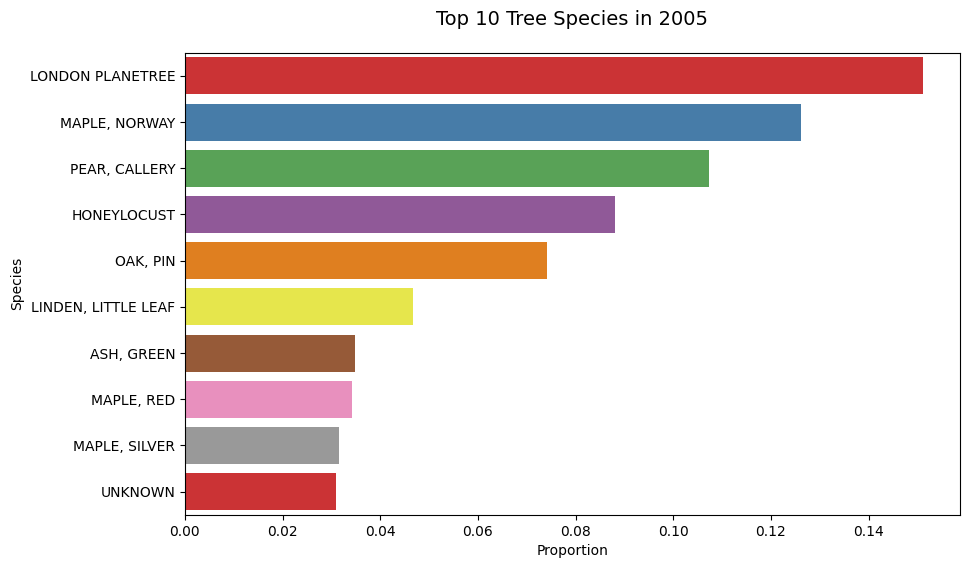

C:\Users\deepi\AppData\Local\Temp\ipykernel_25296\2174344200.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_species_df.sort_values(by='proportion', ascending=False), x='proportion', y='species', palette='Set2')


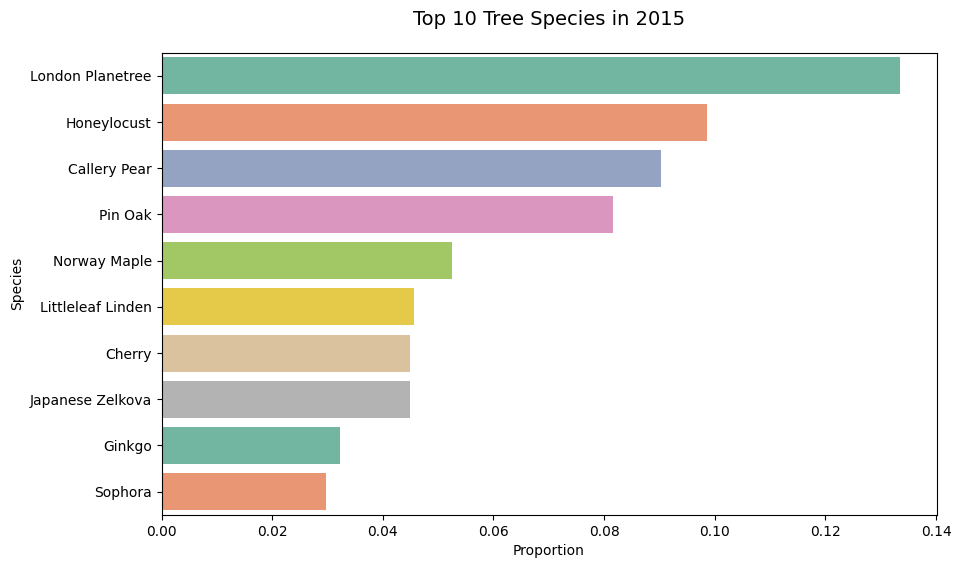

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have DataFrames df and df1 with columns like 'spc_common'

# Normalize tree counts by tree species for df1
species_counts_df1 = df1["spc_common"].value_counts(normalize=True, dropna=True).reset_index()
species_counts_df1.columns = ["species", "proportion"]

# Select the top 10 species for df1
top_species_df1 = species_counts_df1.head(10)

# Plotting for df1 with different colors
plt.figure(figsize=(10, 6))
sns.barplot(data=top_species_df1.sort_values(by='proportion', ascending=False), x='proportion', y='species', palette='Set1')
plt.title('Top 10 Tree Species in 2005', fontsize=14, pad=20)
plt.xlabel('Proportion')
plt.ylabel('Species')
plt.show()

# Normalize tree counts by tree species for df
species_counts_df2 = df2["spc_common"].value_counts(normalize=True, dropna=True).reset_index()
species_counts_df2.columns = ["species", "proportion"]

# Select the top 10 species for df
top_species_df = species_counts_df2.head(10)

# Plotting for df with different colors
plt.figure(figsize=(10, 6))
sns.barplot(data=top_species_df.sort_values(by='proportion', ascending=False), x='proportion', y='species', palette='Set2')
plt.title('Top 10 Tree Species in 2015', fontsize=14, pad=20)
plt.xlabel('Proportion')
plt.ylabel('Species')
plt.show()


C:\Users\deepi\AppData\Local\Temp\ipykernel_25296\2897817701.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=species_counts_boro[:display_top].sort_values(by='proportion', ascending=False),
C:\Users\deepi\AppData\Local\Temp\ipykernel_25296\2897817701.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=species_counts_boro[:display_top].sort_values(by='proportion', ascending=False),
C:\Users\deepi\AppData\Local\Temp\ipykernel_25296\2897817701.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=species_counts_boro[:display

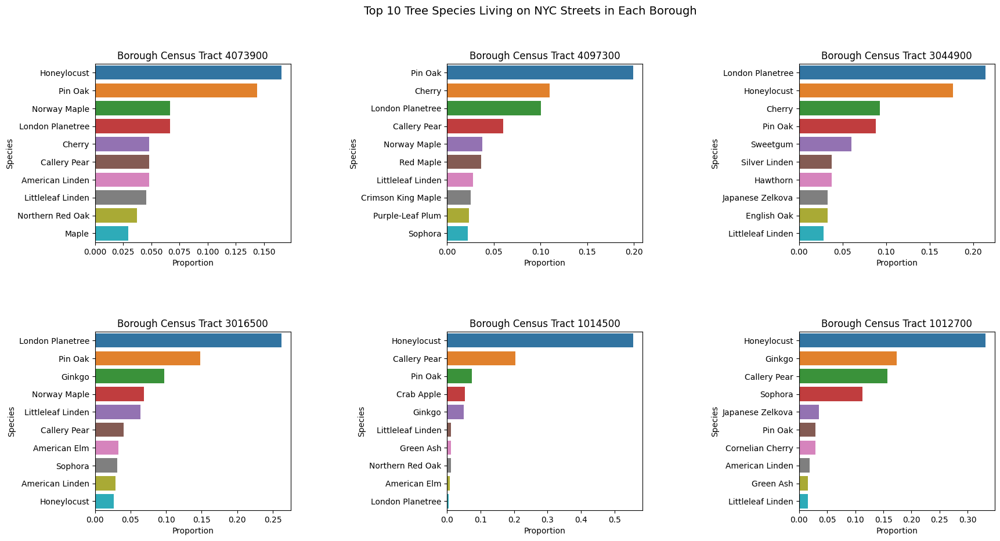

In [103]:
# Function to create subplots for each borough
def plot_top_species_by_borough(df, display_top=10):
    plt.figure(figsize=(20, 10))
    plt.suptitle('Top {} Tree Species Living on NYC Streets in Each Borough'.format(display_top), fontsize=14)

    unique_boro_cts = df2['boro_ct'].unique()

    for i, boro_ct in enumerate(unique_boro_cts[:6]):  # Limit to the first 6 unique boroughs
        ax = plt.subplot(2, 3, i + 1)
        species_counts_boro = df2[df2['boro_ct'] == boro_ct]["spc_common"].value_counts(normalize=True, dropna=True).reset_index()
        species_counts_boro.columns = ["species", "proportion"]

        sns.barplot(data=species_counts_boro[:display_top].sort_values(by='proportion', ascending=False),
                    x='proportion', y='species', palette='tab10')
        plt.title(f'Borough Census Tract {boro_ct}')
        plt.ylabel('Species')
        plt.xlabel('Proportion')
        plt.subplots_adjust(hspace=0.5, wspace=0.8)

    plt.show()

# Plot for df2
plot_top_species_by_borough(df2)

In [104]:
# Print overall statistics
print("There are {} different species of tree living on NYC streets.".format(len(species_counts)))

print("\nThe top {} most common tree species represent {}% of the total NYC street trees population.\n{} species make up the remaining {}% of the tree population.\n".format(
    len(top_species),
    round(top_species.proportion.sum() * 100, 2),
    len(species_counts) - len(top_species),
    round(species_counts[len(top_species):].proportion.sum() * 100, 2)
))

# Print overall statistics
print("Overall, the most common species of tree is the {}.\n{}% of all NYC street trees are {}.".format(
        species_counts.species[0],
        round(species_counts.proportion[0] * 100, 2),
        species_counts.species[0]
    ))

# Print remaining top overall statistics
for i in range(1, 10):
    print("{}% are {}".format(
        round(species_counts.proportion[i] * 100, 2),
        species_counts.species[i]
    ))

# Print statistics for each borough
for boro_ct in df2.boro_ct.unique().tolist():
    # Filter data for the current borough
    borough_data = df2[df2['boro_ct'] == boro_ct]
    
    # Calculate species counts for the current borough
    species_counts_boro = borough_data['spc_common'].value_counts(normalize=True, dropna=True).reset_index()
    species_counts_boro.columns = ["species", "proportion"]

    # Check if there are species counts for the borough
    if not species_counts_boro.empty:
        # Print top statistic for the borough
        print("\nIn the borough census tract {}, the most common species of tree is the {}.\n{}% of all NYC street trees in {} are {}.".format(
            boro_ct,
            species_counts_boro.species[0],
            round(species_counts_boro.proportion[0] * 100, 2),
            boro_ct,
            species_counts_boro.species[0]
        ))
        
        # Print remaining statistics for the borough
        for i in range(1, min(10, len(species_counts_boro))):
            print("{}% are {}".format(
                round(species_counts_boro.proportion[i] * 100, 2),
                species_counts_boro.species[i]
            ))
    else:
        print(f"No data available for the borough census tract {boro_ct}.")


There are 169 different species of tree living on NYC streets.

The top 10 most common tree species represent 72.5% of the total NYC street trees population.
159 species make up the remaining 27.5% of the tree population.

Overall, the most common species of tree is the LONDON PLANETREE.
15.11% of all NYC street trees are LONDON PLANETREE.
12.61% are MAPLE, NORWAY
10.74% are PEAR, CALLERY
8.81% are HONEYLOCUST
7.41% are OAK, PIN
4.67% are LINDEN, LITTLE LEAF
3.48% are ASH, GREEN
3.42% are MAPLE, RED
3.15% are MAPLE, SILVER
3.1% are UNKNOWN

In the borough census tract 4073900, the most common species of tree is the Honeylocust.
16.53% of all NYC street trees in 4073900 are Honeylocust.
14.4% are Pin Oak
6.67% are Norway Maple
6.67% are London Planetree
4.8% are Cherry
4.8% are Callery Pear
4.8% are American Linden
4.53% are Littleleaf Linden
3.73% are Northern Red Oak
2.93% are Maple

In the borough census tract 4097300, the most common species of tree is the Pin Oak.
19.94% of all NYC

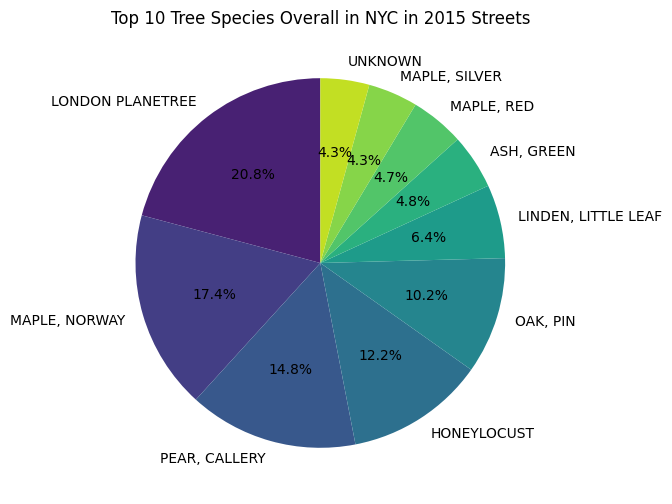

In [105]:
# Overall statistics visualization with pie chart
plt.figure(figsize=(8, 6))
plt.pie(species_counts['proportion'][:10], labels=species_counts['species'][:10], autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', n_colors=10))
plt.title('Top 10 Tree Species Overall in NYC in 2015 Streets')
plt.show()

In [106]:
# print list of all unique tree species (common species names)
print(species_counts.species.to_list())

['LONDON PLANETREE', 'MAPLE, NORWAY', 'PEAR, CALLERY', 'HONEYLOCUST', 'OAK, PIN', 'LINDEN, LITTLE LEAF', 'ASH, GREEN', 'MAPLE, RED', 'MAPLE, SILVER', 'UNKNOWN', 'GINKGO', 'ZELKOVA, JAPANESE', 'OAK, NORTHERN RED', 'CHERRY, OTHER', 'SWEETGUM', 'MAPLE, NORWAY-CR KNG', 'LINDEN, AMERICAN', 'JAPANESE PAGODA TREE', 'LINDEN, SILVER', 'ELM, AMERICAN', 'PLUM, PURPLELEAF', 'Unknown Dead', 'MAPLE, SUGAR', 'BLACK LOCUST', 'MAPLE, SYCAMORE', 'MAPLE, JAPANESE', 'OAK, WILLOW', 'CHOKECHERRY, SHUBERT', 'DOGWOOD, FLOWERING', 'ELM, CHINESE', 'CRABAPPLE', 'OAK, WHITE', 'HACKBERRY', 'MAPLE, AMUR', 'BALDCYPRESS', 'TREE OF HEAVEN', 'PINE, EASTERN WHITE', 'MAPLE, HEDGE', 'MULBERRY', 'HORSECHESTNUT', 'HORNBEAM, EUROPEAN', 'BIRCH, OTHER', 'JAPANESE TREE LILAC', 'HAWTHORN, OTHER', 'DAWN REDWOOD', 'MAPLE, OTHER', 'MAGNOLIA, OTHER', 'OAK, ENGLISH', 'OAK, SWAMP WHITE', 'ASH, OTHER', 'KENTUCKY COFFEETREE', 'GOLDENRAIN TREE', 'REDBUD, EASTERN', 'SPRUCE, OTHER', 'TULIP TREE', 'OAK, OTHER', 'KATSURA TREE', 'PINE, OTHER'

In [107]:
# normalized value counts for status of all trees
status_counts = df2.status.value_counts(normalize=True)
status_counts

Alive    0.953765
Stump    0.025818
Dead     0.020417
Name: status, dtype: float64

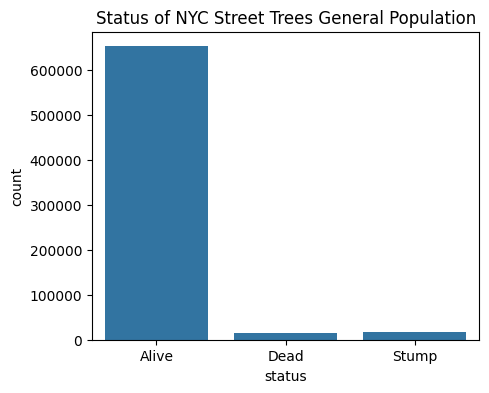

In [108]:
plt.figure(figsize=(5,4))
sns.countplot(data=df2, x='status')
plt.title('Status of NYC Street Trees General Population')
plt.show()

In [109]:
# normalized value counts for health of all trees
health_counts = df2[df2.status=='Alive'].health.value_counts(normalize=True, dropna=True)
health_counts

Good    0.810906
Fair    0.147973
Poor    0.041121
Name: health, dtype: float64

In [110]:
# normalized value counts for health of all trees by borough
health_counts_boro = df2[df2.status=='Alive'].groupby('boro_ct')['health'].value_counts(normalize=True).unstack().sort_values(by='Good')
health_counts_boro

health,Fair,Good,Poor
boro_ct,,,
4091800,0.153846,0.153846,0.692308
3025902,0.714286,0.285714,NaN
1015601,0.548780,0.317073,0.134146
4099802,0.557143,0.342857,0.100000
4097202,0.656250,0.343750,NaN
...,...,...,...
1008602,NaN,1.000000,NaN
2031900,NaN,1.000000,NaN
4071600,NaN,1.000000,NaN


In [111]:
# make a copy of the data where tree status is alive and drop na values
data_alive = df2[df2.status=='Alive'].dropna().copy()
# change the health variable type to categorical and order by value counts
data_alive['health'] = pd.Categorical(data_alive['health'], data_alive.health.value_counts().index.tolist())
data_alive.head(5)

,created_at,tree_id,block_id,the_geom,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,...,st_assem,st_senate,nta,nta_name,boro_ct,state,Latitude,longitude,x_sp,y_sp
0,08/27/2015,180683,348711,POINT (-73.84421521958048 40.723091773924274),3,0,OnCurb,Alive,Fair,Acer rubrum,...,28,16,QN17,Forest Hills,4073900,New York,40.723092,-73.844215,1.027431e+06,202756.768749
1,09/03/2015,200540,315986,POINT (-73.81867945834878 40.79411066708779),21,0,OnCurb,Alive,Fair,Quercus palustris,...,27,11,QN49,Whitestone,4097300,New York,40.794111,-73.818679,1.034456e+06,228644.837379
2,09/05/2015,204026,218365,POINT (-73.93660770459083 40.717580740099116),3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,50,18,BK90,East Williamsburg,3044900,New York,40.717581,-73.936608,1.001823e+06,200716.891267
3,09/05/2015,204337,217969,POINT (-73.93445615919741 40.713537494833226),10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,53,18,BK90,East Williamsburg,3044900,New York,40.713537,-73.934456,1.002420e+06,199244.253136
4,08/30/2015,189565,223043,POINT (-73.97597938483258 40.66677775537875),21,0,OnCurb,Alive,Good,Tilia americana,...,44,21,BK37,Park Slope-Gowanus,3016500,New York,40.666778,-73.975979,9.909138e+05,182202.425999


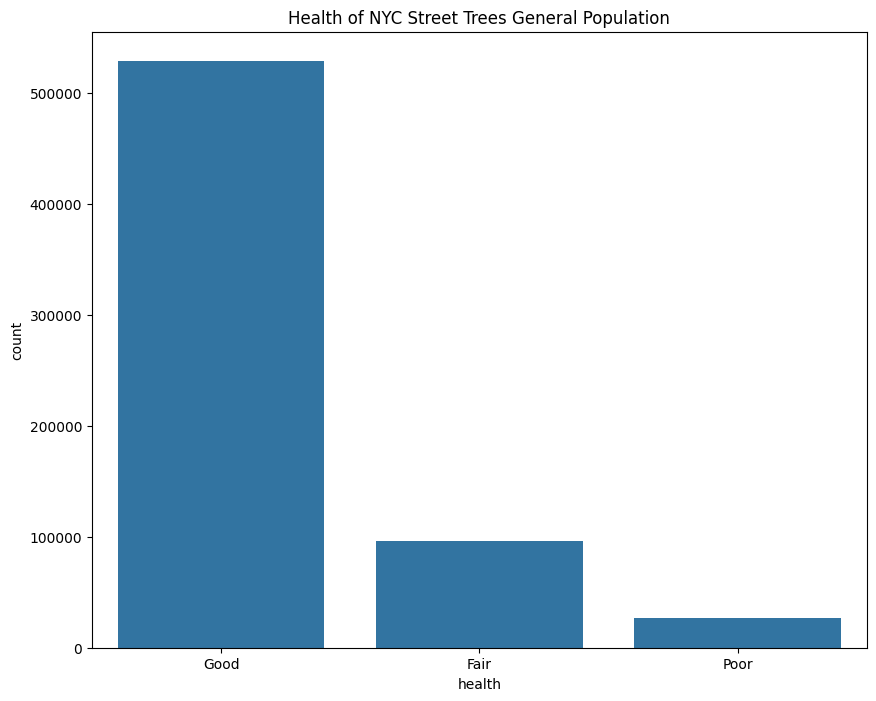

In [112]:
plt.figure(figsize=(10,8))
sns.countplot(
    data=data_alive,
    x='health'
)
plt.title('Health of NYC Street Trees General Population')
plt.show()

In [113]:
# calculate mean tree diameter by species using pandas groupby
top_species_diameter = df2[df2.spc_common.isin(list(top_species1.species))].groupby('spc_common')['tree_dbh'].mean().sort_values(ascending=False)
top_species_diameter

spc_common
London Planetree     21.560657
Pin Oak              16.867707
Norway Maple         14.330516
Honeylocust          10.210958
Littleleaf Linden    10.045827
Sophora               9.254628
Callery Pear          8.958307
Ginkgo                8.625476
Japanese Zelkova      7.863559
Cherry                5.691041
Name: tree_dbh, dtype: float64

In [114]:
# build a dataframe of statistics that describe the tree diameter by species
top_species_diam_report = pd.DataFrame(index=top_species_diameter.index, columns=['mean', 'var', 'std', '25%', '50%', '75%'])
for i, s in enumerate(top_species_diameter.index):
    top_species_diam_report.iloc[i]['mean'] = df2.tree_dbh[df2.spc_common==s].mean()
    top_species_diam_report.iloc[i]['var'] = df2.tree_dbh[df2.spc_common==s].var()
    top_species_diam_report.iloc[i]['std'] = df2.tree_dbh[df2.spc_common==s].std()
    top_species_diam_report.iloc[i]['25%'] = df2.tree_dbh[df2.spc_common==s].quantile(0.25)
    top_species_diam_report.iloc[i]['50%'] = df2.tree_dbh[df2.spc_common==s].quantile(0.5)
    top_species_diam_report.iloc[i]['75%'] = df2.tree_dbh[df2.spc_common==s].quantile(0.75)
top_species_diam_report

,mean,var,std,25%,50%,75%
spc_common,,,,,,
London Planetree,21.560657,81.958918,9.053116,16.0,22.0,27.0
Pin Oak,16.867707,102.227271,10.11075,8.0,17.0,24.0
Norway Maple,14.330516,35.995413,5.999618,10.0,14.0,18.0
Honeylocust,10.210958,27.01634,5.197724,6.0,10.0,13.0
Littleleaf Linden,10.045827,42.755473,6.538767,5.0,9.0,13.0
Sophora,9.254628,31.575953,5.619248,5.0,8.0,13.0
Callery Pear,8.958307,22.631097,4.757215,6.0,8.0,11.0
Ginkgo,8.625476,31.594492,5.620898,4.0,8.0,12.0
Japanese Zelkova,7.863559,28.063757,5.297524,4.0,6.0,11.0


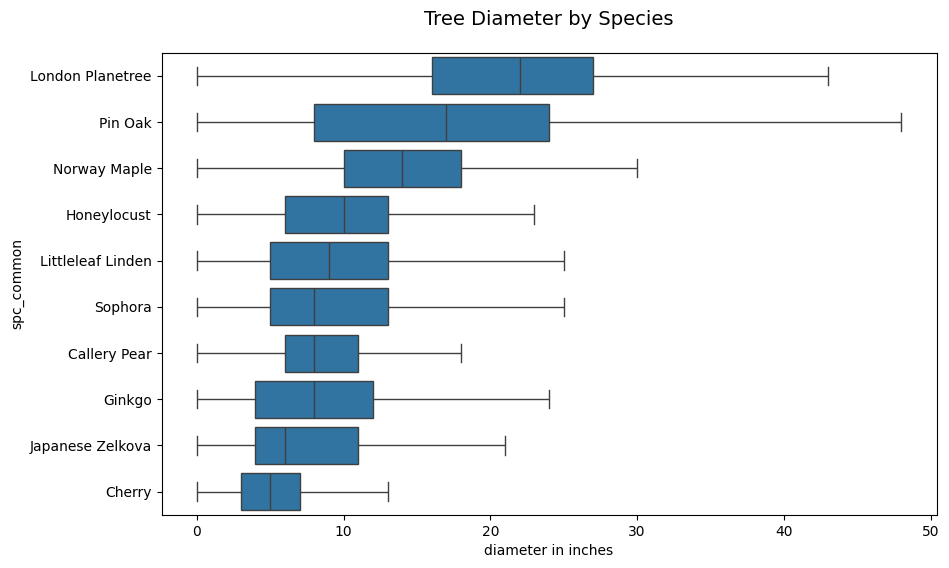

In [115]:
plt.figure(figsize=(10,6))
ax = plt.subplot()
sns.boxplot(data=df2[df2.spc_common.isin(list(top_species1.species))],
            x='tree_dbh',
            y='spc_common',
            order=top_species_diameter.index,
            showfliers=False
           )
plt.xlabel('diameter in inches')
plt.title('Tree Diameter by Species', fontsize=14, pad=20)
plt.show()

In [132]:

def create_trees_geodf(variable_name, variable_value, data_frame):
    data = data_frame[data_frame[variable_name] == variable_value]
    geometry = [Point(xy) for xy in zip(data.longitude, data.Latitude)]
    geo_data_frame = gpd.GeoDataFrame(data, geometry=geometry)
    return geo_data_frame

In [133]:
# function for plotting geolocation data on nyc borough boundaries map
def plot_geo_data(boundaries, geo_data_frame, boro_names, boro_colors, title, labels, label_variable, legend_title):
    fig = plt.figure(figsize=(15,15))
    ax = plt.subplot()
    shapes = boundaries.plot(ax=ax, alpha=0.3, edgecolor='black', cmap='tab10')
    
    for label, color in labels:
        data = geo_data_frame[geo_data_frame[label_variable]==label]
        marker_size = data.tree_dbh        
        data.plot(ax=ax, markersize=marker_size, alpha=0.3, color=color)
    
    # plt custom legend
    for label, color in labels:
        plt.scatter([], [], c=color, s=200,
                label=str(label))
    plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title=legend_title)                      
    plt.title(title, fontsize=14, pad=20)
    plt.axis("off")
    plt.show()

In [134]:
# Open shapefiles with NYC Borough boundaries
borough_boundaries = gpd.read_file(r'C:\Users\deepi\OneDrive\Desktop\Borough Boundaries\geo_export_c3c6d7e6-642c-43ec-b11d-d542b83a09d4.shp')
borough_boundaries

,boro_code,boro_name,shape_area,shape_leng,geometry
0,5.0,Staten Island,1.623621e+09,325917.353950,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,2.0,Bronx,1.187175e+09,463179.772813,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
2,4.0,Queens,3.041419e+09,888199.730955,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ..."
3,1.0,Manhattan,6.365205e+08,357713.308660,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,3.0,Brooklyn,1.934138e+09,728148.532410,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ..."


In [135]:
boro_names = borough_boundaries.boro_name.to_list()
boro_colors = ['red', 'green', 'orange', 'blue', 'pink']
dict(list(zip(boro_names, boro_colors)))

{'Staten Island': 'red',
 'Bronx': 'green',
 'Queens': 'orange',
 'Manhattan': 'blue',
 'Brooklyn': 'pink'}

In [136]:
column_names = df.columns.tolist()

# Print the column names
print(column_names)

['the_geom', 'BoroCode', 'BoroName', 'Shape_Leng', 'Shape_Area']


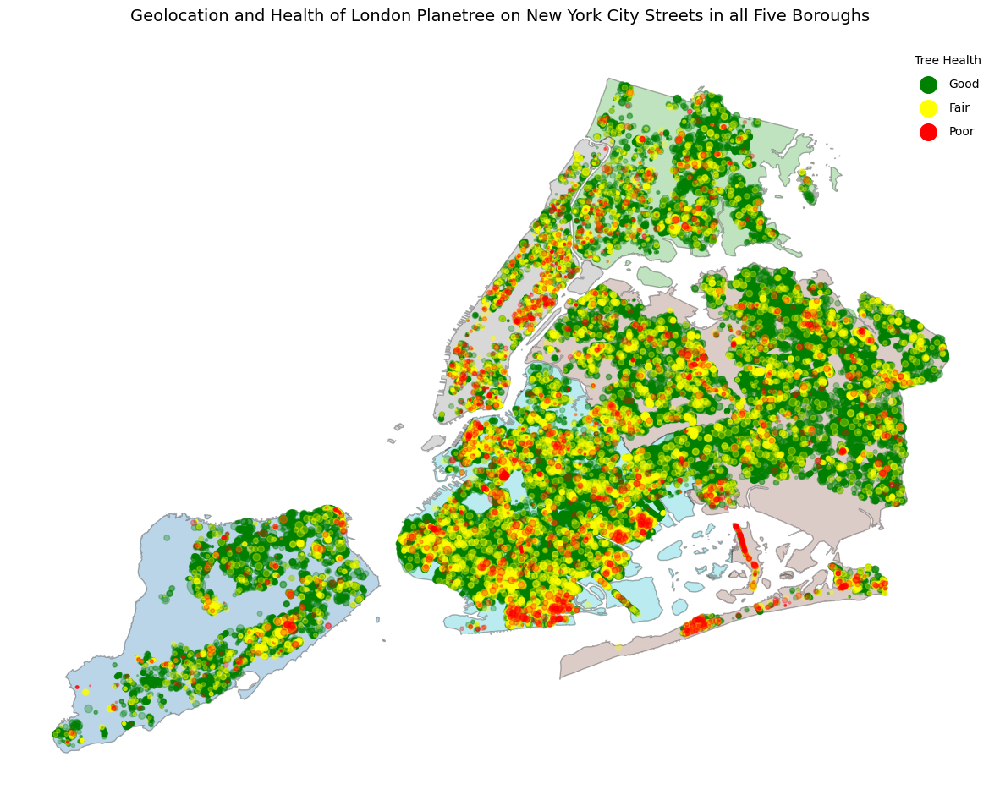

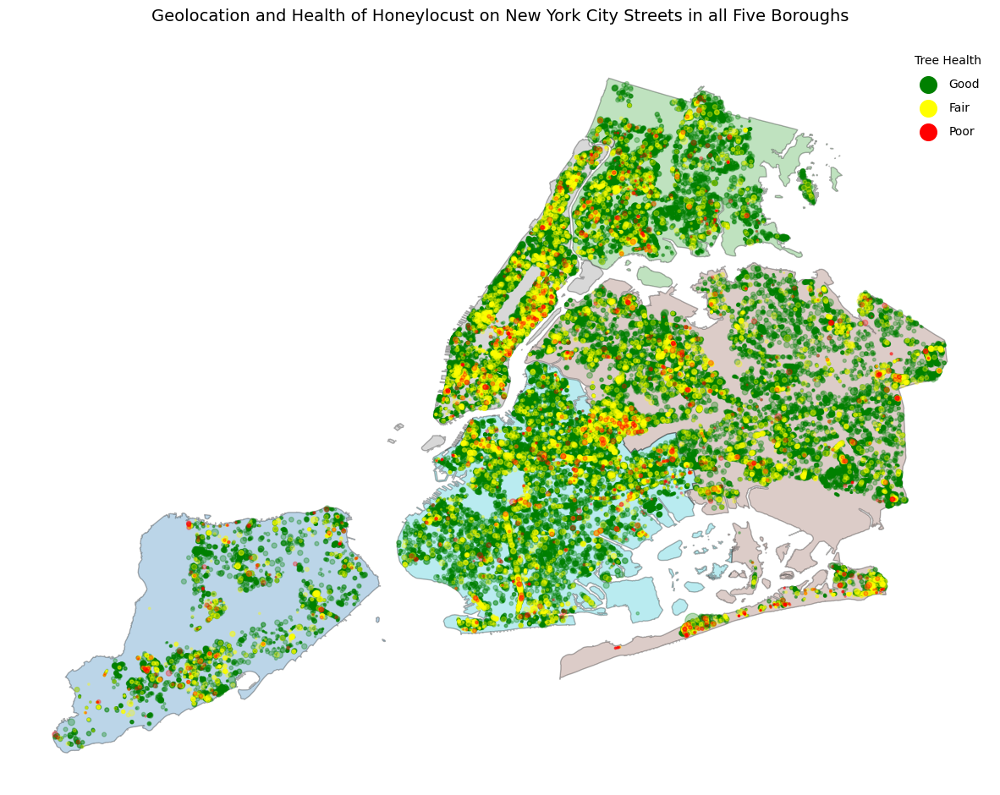

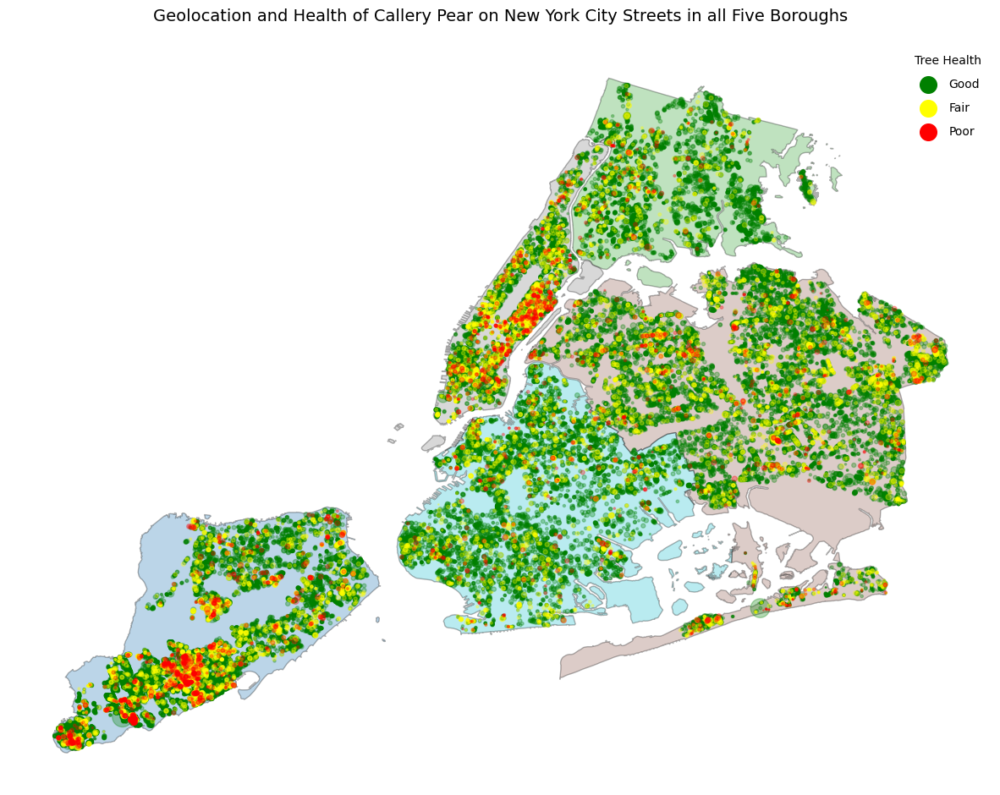

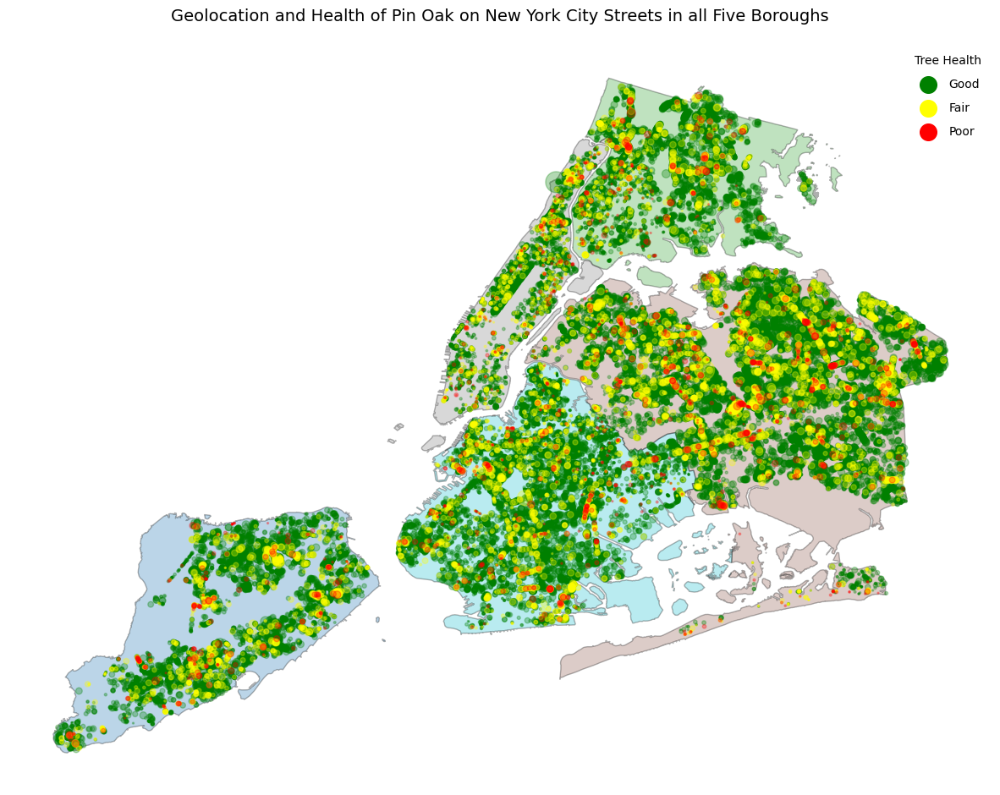

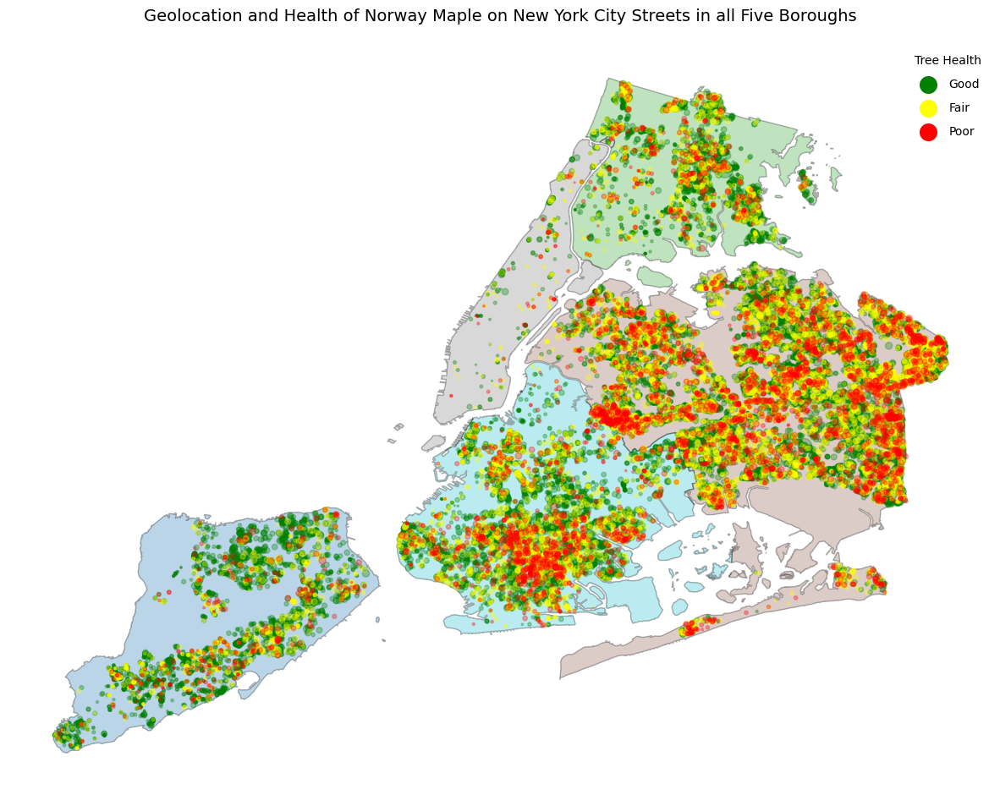

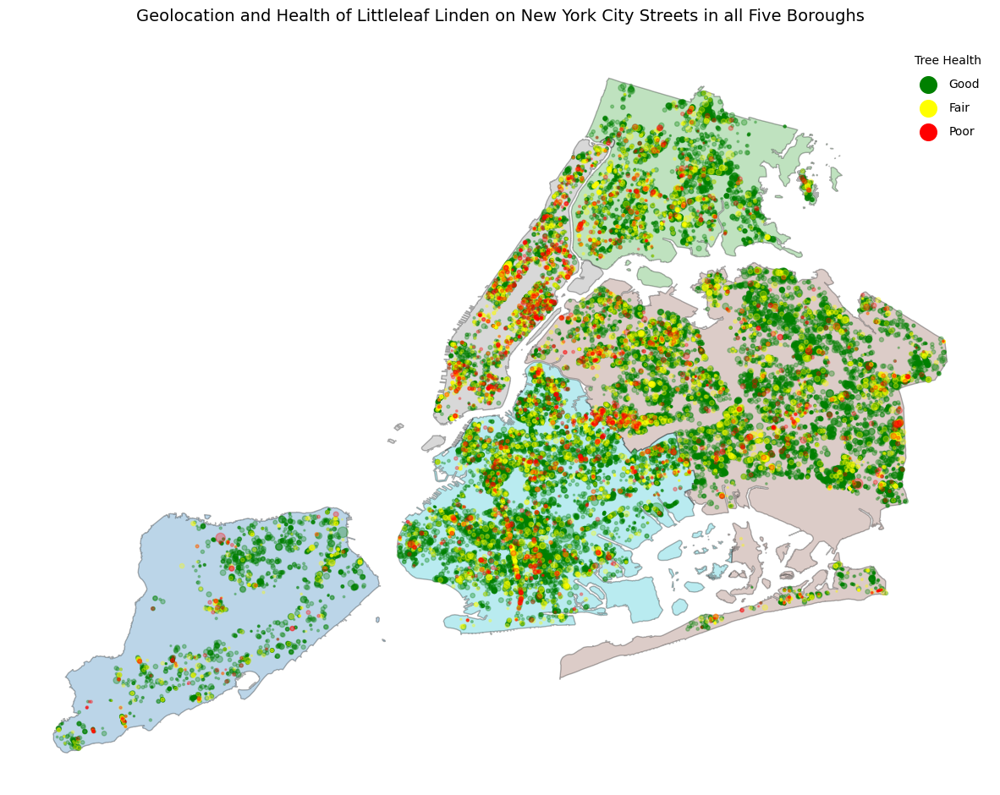

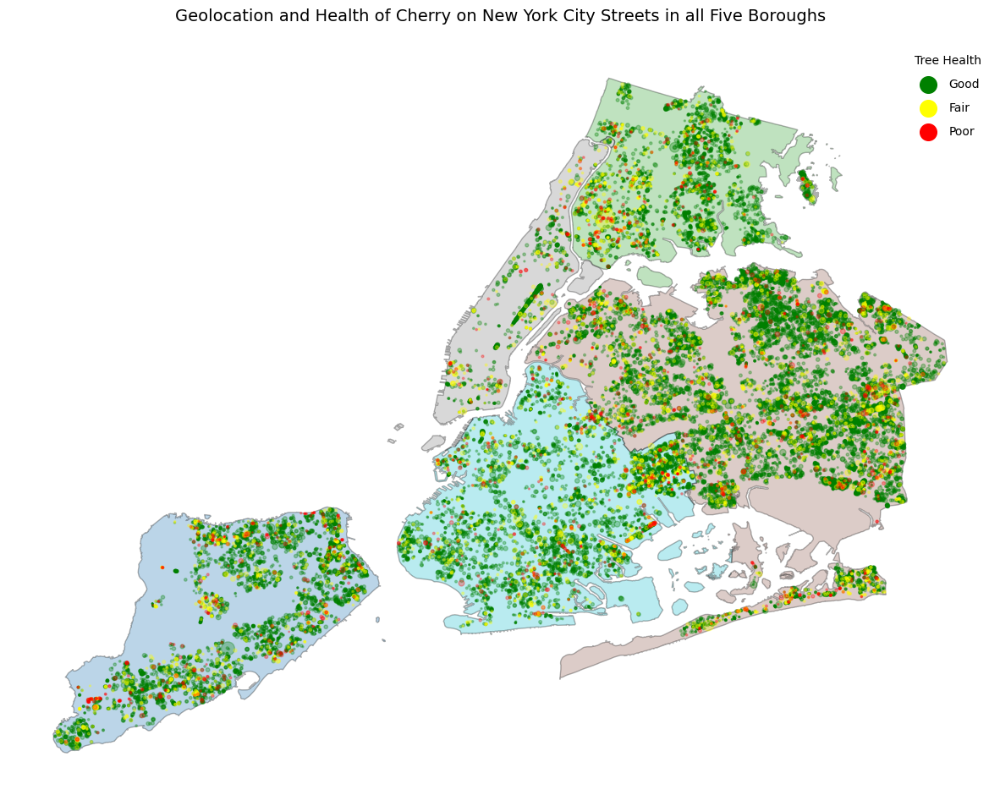

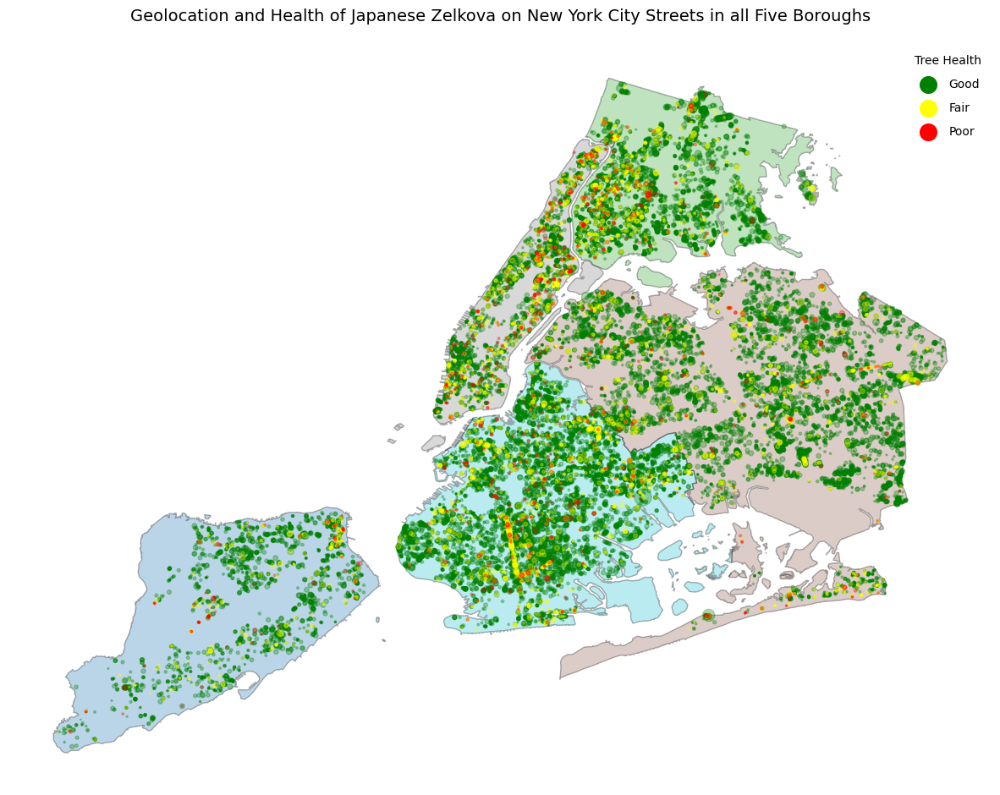

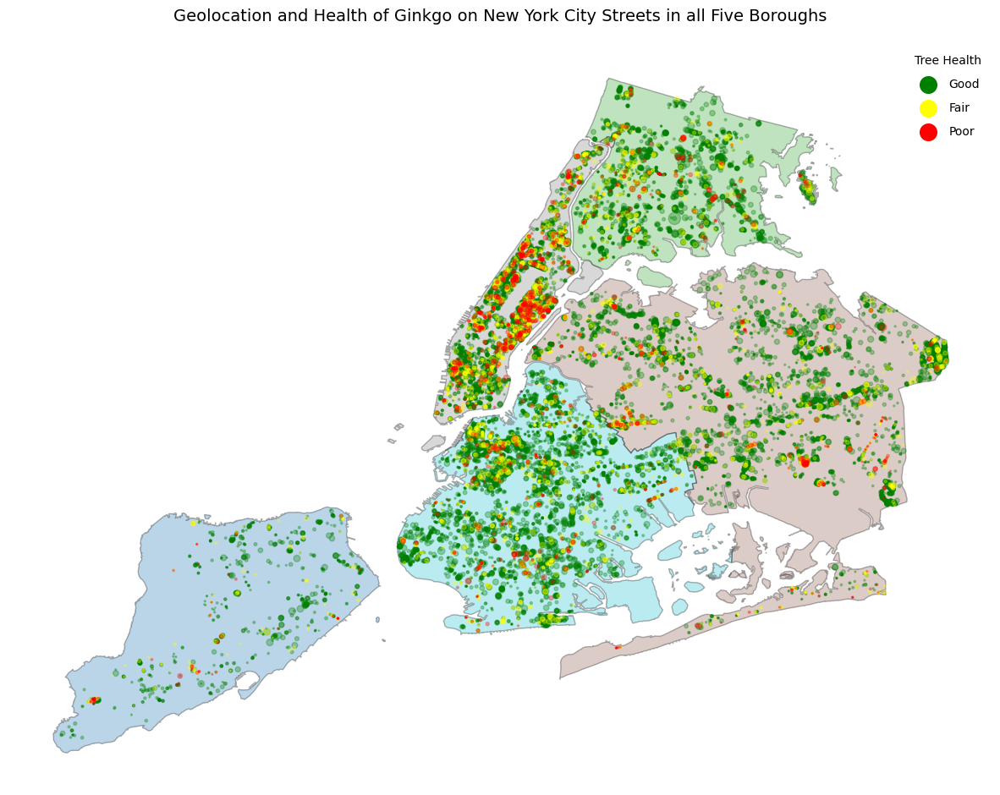

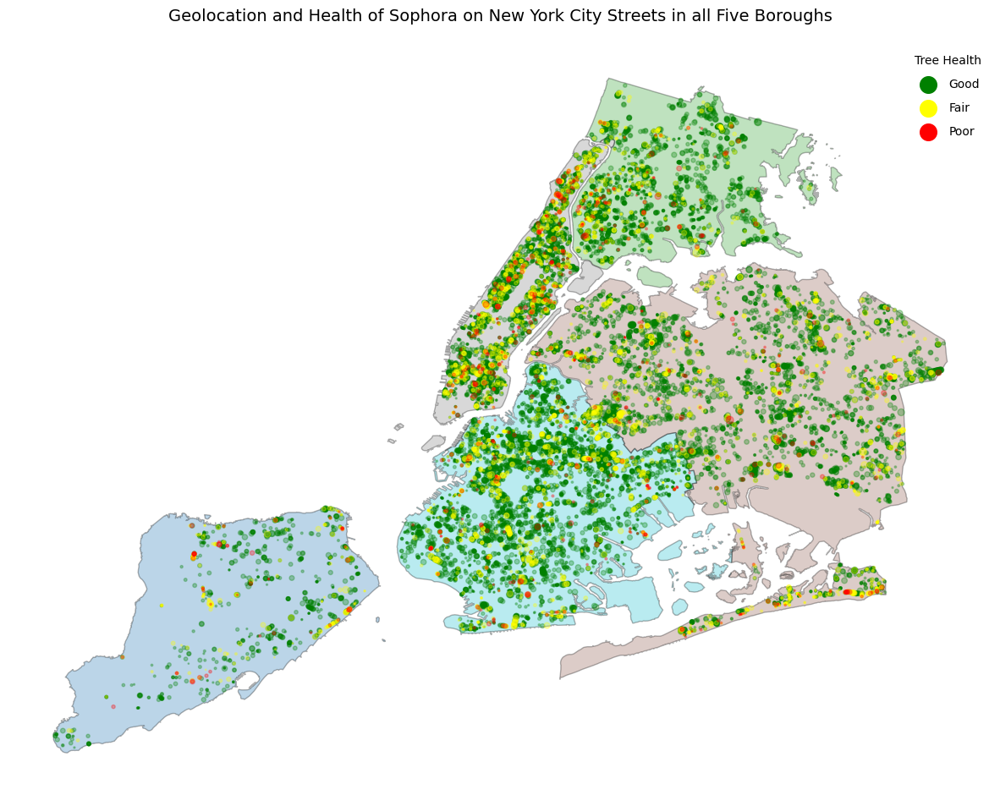

In [137]:
for species in top_species1.species:
    plot_geo_data(
        boundaries=borough_boundaries,
        geo_data_frame=create_trees_geodf(
            variable_name='spc_common',
            variable_value=species.title(),
            data_frame=df2[['spc_common', 'tree_dbh', 'health', 'longitude', 'Latitude']]),
        boro_names=boro_names,
        boro_colors=boro_colors,
        title="Geolocation and Health of {} on New York City Streets in all Five Boroughs".format(species.title()),
        labels = [("Good", "green"), ("Fair", "yellow"), ("Poor", "red")],
        label_variable = 'health',
        legend_title = 'Tree Health'        
    )